In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt

import os

In [ ]:
#path where files are stored
path='/content/drive/MyDrive/train_images'

file_path=os.listdir(path)

print('folders present in the train images are\n',file_path)

folders present in the train images are
 ['not_smoking', 'smoking']


#observation:

1.We had given a folder called Train images in which it contains two folders mainly ,i.e smoking and mot_smoking

2.So,our image classification is of binary type i.e given an image we need to recoginize whether it is smoking or not_smoking image

In [ ]:
#getting all images present in the each folder
non_smoking=os.listdir('/content/drive/MyDrive/train_images/not_smoking')
smoking=os.listdir('/content/drive/MyDrive/train_images/smoking')

print(smoking[:5])
print(non_smoking[:5])

['bb0053.jpg', 'b00299.jpg', 'b00292.jpg', 'b00401.jpg', 'bb0111.jpg']
['gg0307.jpg', 'gg0300.JPG', 'gg0304.jpg', 'gg0301.jpg', 'gg0302.jpg']


In [ ]:
smoke_images=len(smoking)
nonsmoke_images=len(non_smoking)

print('no of smoking images:',smoke_images)
print('no of non smoke images',nonsmoke_images)
print('total no of images:',smoke_images+nonsmoke_images)

no of smoking images: 1993
no of non smoke images 1276
total no of images: 3269


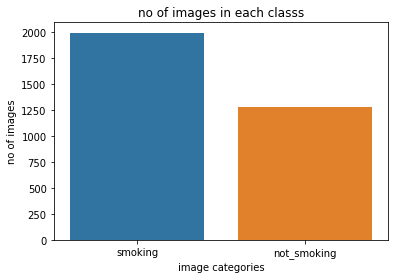

In [ ]:
sns.barplot(x=[0,1],y=[smoke_images,nonsmoke_images])
plt.title('no of images in each classs')
plt.xlabel('image categories')
plt.ylabel('no of images')
plt.xticks([0,1],['smoking','not_smoking'])
plt.show()

#observation:
1.As we know we given a binary classifcation,no of images in smoking category is 1276 and for not_smoking category -1993 i.e we can observe that there are approximately 700 more smoking images than non smoking,so it is somewhat imbalanced but as we have more smoke inmages so or model will see more pssobilites of smokers which helps to classify the image

#creating data Frame

In [ ]:
#this function adds the path for each image from where it is stored
def add_path(x):
  #if given image is in non_smoking folder then we going add path to it
  if x in non_smoking:
    path='/content/drive/MyDrive/train_images/not_smoking'
    output=os.path.join(path,x)

 #if given image is in smoking folder then we going add path to it
  else:
    path='/content/drive/MyDrive/train_images/smoking'
    output=os.path.join(path,x)

  return output

In [ ]:
#creating labels i.e for smoking - making class 1 and adding path to location

class_1=np.ones(smoke_images)

smoke_data=pd.DataFrame(data={'images':smoking,'label':class_1.astype('int')})
smoke_data['images']=smoke_data['images'].apply(add_path)
smoke_data.head()


,images,label
0,/content/drive/MyDrive/train_images/smoking/bb...,1
1,/content/drive/MyDrive/train_images/smoking/b0...,1
2,/content/drive/MyDrive/train_images/smoking/b0...,1
3,/content/drive/MyDrive/train_images/smoking/b0...,1
4,/content/drive/MyDrive/train_images/smoking/bb...,1


In [ ]:
#and for nonsmoking images making class 0 and adding path to location


class_0=np.zeros(nonsmoke_images)

nonsmoke_data=pd.DataFrame(data={'images':non_smoking,'label':class_0.astype('int')})
nonsmoke_data['images']=nonsmoke_data['images'].apply(add_path)
nonsmoke_data.head()


,images,label
0,/content/drive/MyDrive/train_images/not_smokin...,0
1,/content/drive/MyDrive/train_images/not_smokin...,0
2,/content/drive/MyDrive/train_images/not_smokin...,0
3,/content/drive/MyDrive/train_images/not_smokin...,0
4,/content/drive/MyDrive/train_images/not_smokin...,0


In [ ]:
#this function take a image file and takes the format name like jpg,png...
def type(x):
  #x is image name which looks like ['bb0053.jpg', 'b00299.jpg', 'b00292.jpg', 'b00401.jpg', 'bb0111.jpg']
  split=x.split(".")[-1]
  return split


type1=smoke_data['images'].apply(type).values
type2=nonsmoke_data['images'].apply(type).values

#concatenating all format names of smoking and non smoking images
all_types=np.concatenate([type1,type2])

formats=pd.DataFrame(data=all_types)

#printing the unique format names with no of images belonging to that format
print('no of formats in given image dataset:')
formats.value_counts()


no of formats in given image dataset:


jpg     2812
jpeg     221
png      106
JPG      103
gif       20
JPEG       6
GIF        1
dtype: int64

#obervation:

In total we have some different formats of images in data,almost there are jpeg,jpg,png formats and only few gifs are present in data

In [ ]:
from PIL import Image 
#function that takes path and return the size of each image
def image_size(paths):
  im=Image.open(paths)
  width, height = im.size
  im.show()
  return height,width


In [ ]:
from tqdm import tqdm
#getting the size of each images in smoking image data
smoke_size=[]
for i in tqdm(smoke_data['images']):
  size=image_size(i)
  smoke_size.append(size)


100%|██████████| 1993/1993 [06:41<00:00,  4.97it/s]


In [ ]:
nonsmoke_size=[]

#getting the size of each images in nonsmoking image data
for i in tqdm(nonsmoke_data['images']):
  size=image_size(i)
  nonsmoke_size.append(size)

100%|██████████| 1276/1276 [12:39<00:00,  1.68it/s]


In [ ]:
#now concatenating the smoking and non smoking images sizes
image_size=np.concatenate([smoke_size,nonsmoke_size])
print('no of unique image size in given dataset',len(np.unique(image_size)))

no of unique image size in given dataset: 1731


In [ ]:
#crateing the data frame with size of all images
df=pd.DataFrame(data={'size':list(image_size)})
df['size']=df['size'].astype('str')


#top 10 images with mostly used sizes
df.value_counts()[:10]

size       
[ 720 1280]    139
[360 480]       87
[1200 1600]     67
[480 852]       44
[1080 1920]     37
[600 800]       34
[640 960]       27
[ 640 1024]     24
[360 640]       24
[ 900 1600]     23
dtype: int64

#observation:
In given dataset,we had total 1731 unique size of images and highest no of images having size of 720x1280 

In [ ]:
#this function display the images
def display(filename):

  im=Image.open(filename)

  return im

#printing some images of non smoking

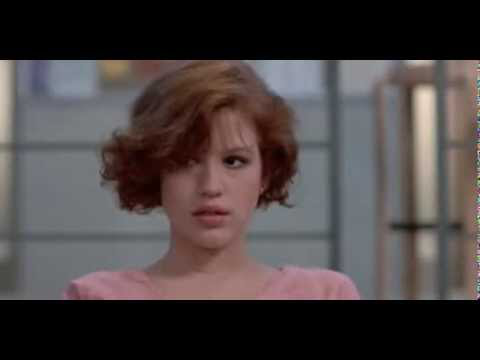

In [ ]:

path='/content/drive/MyDrive/train_images/not_smoking/000015.jpg'
display(path)

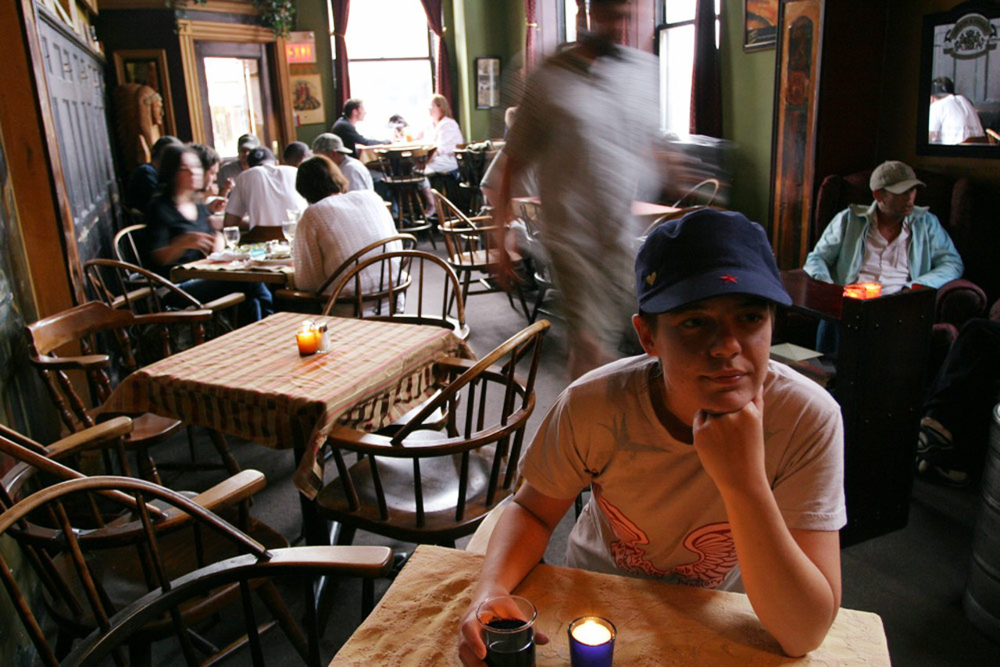

In [ ]:
path='/content/drive/MyDrive/train_images/not_smoking/000279.jpg'
display(path)

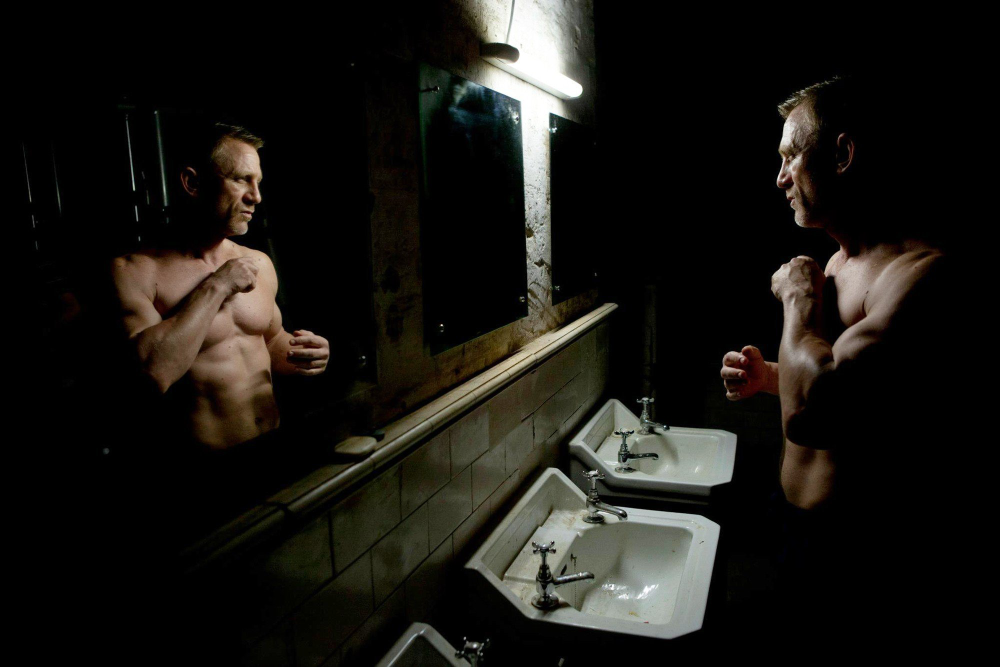

In [ ]:
path='/content/drive/MyDrive/train_images/not_smoking/000373.jpg'
display(path)

#observation:
Basically ,in not smoking images they are some random images which doesnt involves any cigarate things present in the image

#prining some random inages of smoking

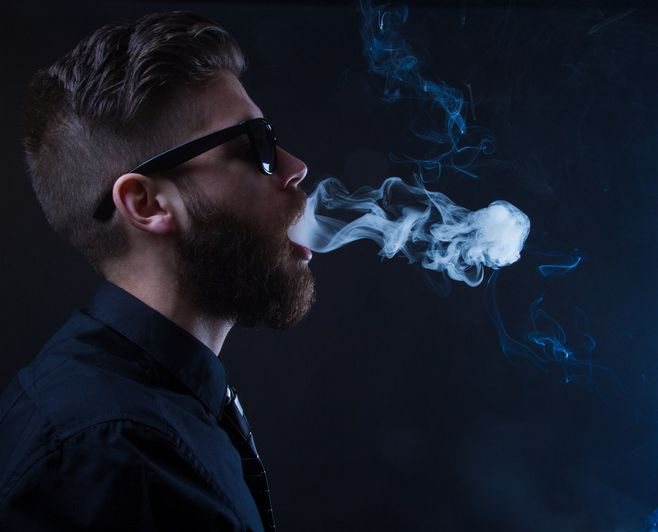

In [ ]:
path='/content/drive/MyDrive/train_images/smoking/000001.jpg'
display(path)

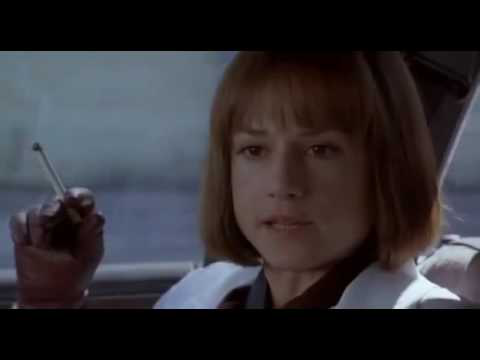

In [ ]:
path='/content/drive/MyDrive/train_images/smoking/000010.jpg'
display(path)

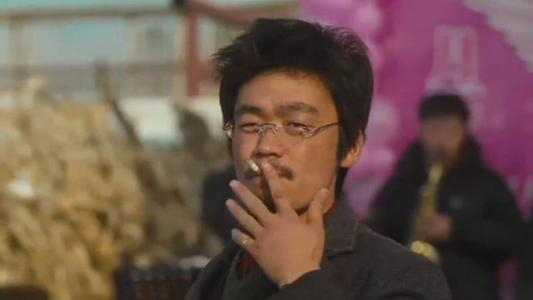

In [ ]:
path='/content/drive/MyDrive/train_images/smoking/000015.jpg'
display(path)

#observations;
in smoke images,it contains a lot varaieties cigerate images and also smoke  which helps the model to understand in recoginition the image and to classify it as whether smoking or not smoking  category

#preprocessing

#image genarator

here am trying to do some augmenation i.e  adding slightly modified copies of already existing data by transformting the images by doing  horizontal flip,vertical flip...etc 

#MODELLING

In [ ]:
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam
from tqdm import tqdm

In [ ]:
from tensorflow.keras.applications import  VGG16
from tensorflow.keras.layers import Conv2D 
from tensorflow.keras.layers import MaxPool2D,Input
from tensorflow.keras.layers import Dense,Flatten,Dropout,AveragePooling2D
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.callbacks import ModelCheckpoint
%load_ext tensorboard
import datetime

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
final=smoke_data.append(nonsmoke_data)
final.shape

(3269, 2)

In [ ]:
data = []

for imagePath in tqdm(final['images']):
    #label = imagePath.split(os.path.sep)[-2]
    image = load_img(imagePath, target_size=(224, 224))
    image = img_to_array(image)
    image = preprocess_input(image)
    data.append(image)

 63%|██████▎   | 2051/3269 [09:47<05:41,  3.57it/s]/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
100%|██████████| 3269/3269 [16:43<00:00,  3.26it/s]


In [ ]:
data  = np.array(data, dtype="float32")
data =data/255
labels=final['label'].values

In [ ]:

(trainX, testX, trainY, testY) = train_test_split(data, labels,test_size=0.10, stratify=labels, random_state=42)

aug = ImageDataGenerator(
    rotation_range=20,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest")

In [ ]:
batch_size=32

In [ ]:
# Initializing CNN
cnn=tf.keras.models.Sequential()

# adding first layer
cnn.add(tf.keras.layers.Conv2D(filters=254,kernel_size=4,padding='same',activation='relu',input_shape=[224,224,3]))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2))

# adding second layer
cnn.add(tf.keras.layers.Conv2D(filters=64,kernel_size=4,padding='same',activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2))

# adding third layer
cnn.add(tf.keras.layers.Conv2D(filters=32,kernel_size=4,padding='same',activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2))

# Flattening
cnn.add(tf.keras.layers.Flatten())

# Fully connected layer
cnn.add(tf.keras.layers.Dense(units=12,activation='relu'))

# Output layers
cnn.add(tf.keras.layers.Dense(units=1,activation='sigmoid'))

cnn.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 224, 224, 254)     12446     
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 112, 112, 254)     0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 112, 112, 64)      260160    
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 56, 56, 64)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 56, 56, 32)        32800     
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 28, 28, 32)        0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 25088)            

In [ ]:
log_dir = "logs/fits/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


filepath="/content/drive/MyDrive/test_images/base_model.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',  verbose=1, save_best_only=True, mode='auto')

In [ ]:
cnn.compile(optimizer='Adam',loss='binary_crossentropy',metrics=['accuracy'])


BS=16
EPOCHS=10
H = cnn.fit(
    aug.flow(trainX, trainY, batch_size=BS),
    steps_per_epoch=len(trainX) // BS,
    validation_data=(testX, testY),
    validation_steps=len(testX) // BS,
    epochs=EPOCHS,callbacks=[tensorboard_callback,checkpoint])

Epoch 1/10
183/183 [==============================] - 69s 352ms/step - loss: 0.6605 - accuracy: 0.6063 - val_loss: 0.6521 - val_accuracy: 0.6086

Epoch 00001: val_accuracy improved from -inf to 0.60856, saving model to /content/drive/MyDrive/test_images/base_model.hdf5
Epoch 2/10
183/183 [==============================] - 56s 307ms/step - loss: 0.6453 - accuracy: 0.6275 - val_loss: 0.6434 - val_accuracy: 0.6239

Epoch 00002: val_accuracy improved from 0.60856 to 0.62385, saving model to /content/drive/MyDrive/test_images/base_model.hdf5
Epoch 3/10
183/183 [==============================] - 55s 297ms/step - loss: 0.6416 - accuracy: 0.6306 - val_loss: 0.6371 - val_accuracy: 0.6453

Epoch 00003: val_accuracy improved from 0.62385 to 0.64526, saving model to /content/drive/MyDrive/test_images/base_model.hdf5
Epoch 4/10
183/183 [==============================] - 56s 303ms/step - loss: 0.6353 - accuracy: 0.6466 - val_loss: 0.6363 - val_accuracy: 0.6636

Epoch 00004: val_accuracy improved fro

In [ ]:
%tensorboard --logdir=logs/fits/

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
cnn.compile(optimizer='Adam',loss='binary_crossentropy',metrics=['accuracy'])


BS=16
EPOCHS=10
H = cnn.fit(
    aug.flow(trainX, trainY, batch_size=BS),
    steps_per_epoch=len(trainX) // BS,
    validation_data=(testX, testY),
    validation_steps=len(testX) // BS,
    epochs=EPOCHS,callbacks=[tensorboard_callback,checkpoint])

Epoch 1/10
183/183 [==============================] - 58s 312ms/step - loss: 0.6177 - accuracy: 0.6746 - val_loss: 0.6140 - val_accuracy: 0.6697

Epoch 00001: val_accuracy did not improve from 0.66972
Epoch 2/10
183/183 [==============================] - 56s 304ms/step - loss: 0.6149 - accuracy: 0.6668 - val_loss: 0.6377 - val_accuracy: 0.6453

Epoch 00002: val_accuracy did not improve from 0.66972
Epoch 3/10
183/183 [==============================] - 58s 316ms/step - loss: 0.6189 - accuracy: 0.6658 - val_loss: 0.6164 - val_accuracy: 0.6789

Epoch 00003: val_accuracy improved from 0.66972 to 0.67890, saving model to /content/drive/MyDrive/test_images/base_model.hdf5
Epoch 4/10
183/183 [==============================] - 57s 309ms/step - loss: 0.6083 - accuracy: 0.6832 - val_loss: 0.6161 - val_accuracy: 0.6881

Epoch 00004: val_accuracy improved from 0.67890 to 0.68807, saving model to /content/drive/MyDrive/test_images/base_model.hdf5
Epoch 5/10
183/183 [==============================] 

In [ ]:
from tensorflow.keras.models import load_model
#model.save('/content/drive/MyDrive/test_images/mobilenet.model', save_format="h5")
mdl=load_model('/content/drive/MyDrive/test_images/base_model.hdf5')

In [ ]:
cnn.save('/content/drive/MyDrive/test_images/simplecnn_1.model', save_format="h5")

In [ ]:
from tensorflow.keras.preprocessing import image
def predict(path):

  image_for_testing=path
  image_show=Image.open(image_for_testing)

  test_image=image.load_img(image_for_testing,target_size=(224,224))
  test_image=image.img_to_array(test_image)
  test_image=test_image/255
  test_image=np.expand_dims(test_image,axis=0)
  result=(cnn.predict(test_image) > 0.5).astype("int32")
  if result[0][0]==0:
    print('its not a smoking image')
  else:
    print('its a smoking')

  return image_show

its not a smoking image


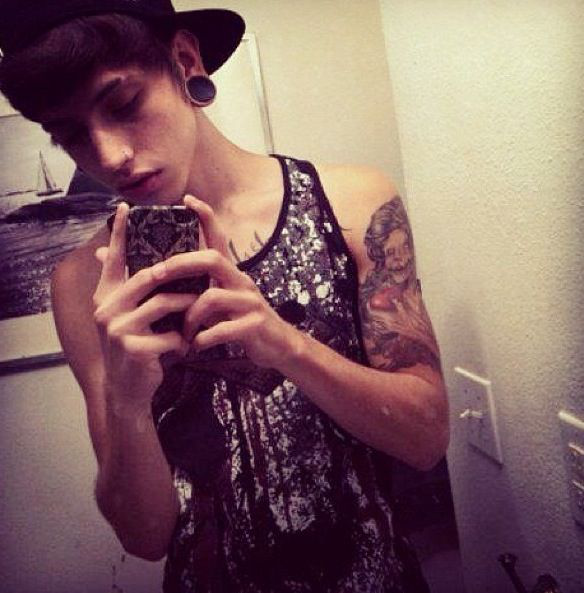

In [ ]:
predict('/content/drive/MyDrive/test_images/test/not_smoking/000137.jpg')

its a smoking


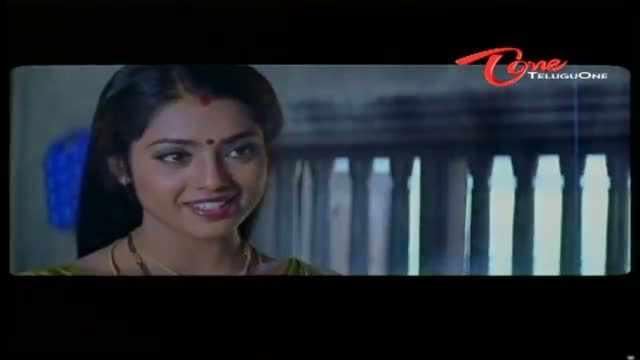

In [ ]:
predict('/content/drive/MyDrive/test_images/test/not_smoking/bb0208.jpg')

its not a smoking image


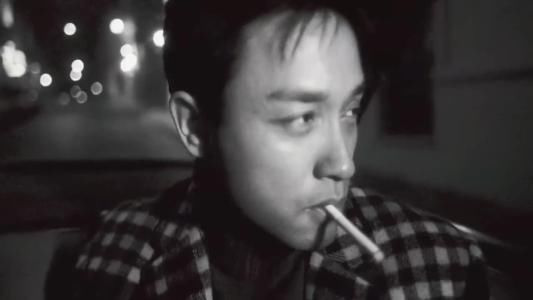

In [ ]:
predict('/content/drive/MyDrive/test_images/test/smoking/000002.jpg')

he is not smoking


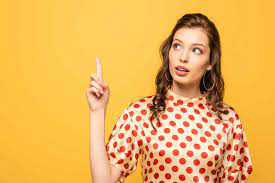

In [ ]:
predict('/content/non.jpg')

he is smoking


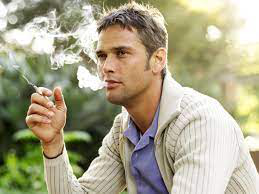

In [ ]:
predict('/content/index1.jpg')

In [ ]:
data=np.load('/content/drive/MyDrive/saved and files/new_data.npy')
label=np.load('/content/drive/MyDrive/saved and files/new_label.npy')